## Loading pakages

In [1]:

!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git

!pip install Ninja

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torchvision.utils import save_image
import clip
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.9 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-au8uq4ox
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-au8uq4ox
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 105.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:

!git clone https://github.com/rosinality/stylegan2-pytorch.git

Cloning into 'stylegan2-pytorch'...
remote: Enumerating objects: 395, done.
remote: Total 395 (delta 0), reused 0 (delta 0), pack-reused 395 (from 1)
Receiving objects: 100% (395/395), 122.51 MiB | 12.43 MiB/s, done.
Resolving deltas: 100% (205/205), done.


In [3]:
cd stylegan2-pytorch/

/content/stylegan2-pytorch


In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [5]:
seed = 3456
torch.manual_seed(seed)


In [6]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# downloads StyleGAN's weights and facial recognition network weights
ids = ['1EM87UquaoQmk17Q8d5kYIAHqu0dkYqdT', '1N0MZSqPRJpLfP4mFQCS14ikrVSe8vQlL']
for file_id in ids:
  downloaded = drive.CreateFile({'id':file_id})
  downloaded.FetchMetadata(fetch_all=True)
  downloaded.GetContentFile(downloaded.metadata['title'])

In [7]:
from model import Generator
latent_dim = 512
generator = Generator(size=1024, style_dim=latent_dim, n_mlp=8).to(device)
state_dict = torch.load('/content/stylegan2-pytorch/stylegan2-ffhq-config-f.pt', map_location=device)
generator.load_state_dict(state_dict['g_ema'])
generator.eval()

print("Generators StyleGAN2 downloaded.")

/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Генератор StyleGAN2 загружены.


/content/stylegan2-pytorch/op/conv2d_gradfix.py:88: UserWarning: conv2d_gradfix not supported on PyTorch 2.6.0+cu124. Falling back to torch.nn.functional.conv2d().
  warnings.warn(


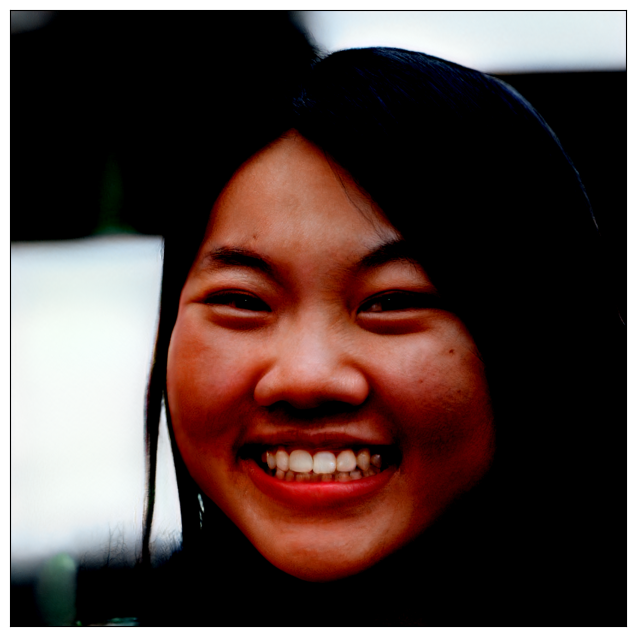

In [8]:
#Let's generate image
latent_z = torch.randn(10000, 512, device=device) # Z noise
latent_z_generated = latent_z.mean(0, keepdim=True)

with torch.no_grad():
  target_img, _ = generator([latent_z_generated], input_is_latent=False)

# Vizualize initial image
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(target_img[0].cpu().permute(1, 2, 0))

In [9]:
G_frozen = generator
G_frozen.eval()
for param in G_frozen.parameters():
    param.requires_grad = False
G_train = Generator(size=G_frozen.size, style_dim=G_frozen.style_dim, n_mlp= 8 ).to(device)
G_train.load_state_dict(G_frozen.state_dict())
for param in G_train.parameters():
    param.requires_grad = False
G_train.eval()

Generator(
  (style): Sequential(
    (0): PixelNorm()
    (1): EqualLinear(512, 512)
    (2): EqualLinear(512, 512)
    (3): EqualLinear(512, 512)
    (4): EqualLinear(512, 512)
    (5): EqualLinear(512, 512)
    (6): EqualLinear(512, 512)
    (7): EqualLinear(512, 512)
    (8): EqualLinear(512, 512)
  )
  (input): ConstantInput()
  (conv1): StyledConv(
    (conv): ModulatedConv2d(512, 512, 3, upsample=False, downsample=False)
    (noise): NoiseInjection()
    (activate): FusedLeakyReLU()
  )
  (to_rgb1): ToRGB(
    (conv): ModulatedConv2d(512, 3, 1, upsample=False, downsample=False)
  )
  (convs): ModuleList(
    (0): StyledConv(
      (conv): ModulatedConv2d(512, 512, 3, upsample=True, downsample=False)
      (noise): NoiseInjection()
      (activate): FusedLeakyReLU()
    )
    (1): StyledConv(
      (conv): ModulatedConv2d(512, 512, 3, upsample=False, downsample=False)
      (noise): NoiseInjection()
      (activate): FusedLeakyReLU()
    )
    (2): StyledConv(
      (conv): Modul

## Losses

$$
\Delta T = E_T(t_{target}) - E_T(t_{source}) \quad (2)
$$

$$
\Delta I = E_I(G_{train}(w)) - E_I(G_{frozen}(w))
$$

$$
L_{direction} = 1 - \frac{\Delta I \cdot \Delta T}{|\Delta I| \cdot |\Delta T|}
$$

Here, $E_I$ and $E_T$ are image and text encoders in CLIP, and $t_{target}$, $t_{source}$ are the texts of the source and target classes.

In [10]:
import torch
import clip


class CLIP_Directional_Loss(torch.nn.Module):
    """
    This class defines a custom CLIP-based loss function (Contrastive Language–Image Pre-training).
    It measures the similarity between an image and a text description.
    """

    def __init__(self, stylegan_size=1024):
        """
        Initializes the CLIPLoss class.

        Args:
            opts: An object containing various parameters, including the size of the StyleGAN image.
        """
        super(CLIP_Directional_Loss, self).__init__()
        # Loading the pre-trained CLIP model and the preprocessing function
        self.model, self.preprocess = clip.load("ViT-B/32", device="cuda")

        self.upsample = torch.nn.Upsample(scale_factor=7)
        self.avg_pool = torch.nn.AvgPool2d(kernel_size=stylegan_size // 32)


    def forward(self, image, text, image_target, text_target):
        """
        Вычисляет потери CLIP между изображением и текстом.

        Args:
            image: Входной тензор изображения.
            text: Тензор текстового описания.

        Returns:
            Значение потерь CLIP.
        """
        # Changing the image dimension to get the desired resolution for the CLIP
        image = self.avg_pool(self.upsample(image))
        img_emb = self.model.encode_image(image)
        text_emb = self.model.encode_text(text)
        img_emb_norm = torch.nn.functional.normalize(img_emb, p=2, dim=1)
        text_emb_norm = torch.nn.functional.normalize(text_emb, p=2, dim=1)
        image_target = self.avg_pool(self.upsample(image_target))
        img_target_emb = self.model.encode_image(image_target)
        text_target_emb = self.model.encode_text(text_target)
        img_target_emb_norm = torch.nn.functional.normalize(img_target_emb, p=2, dim=1)
        text_target_emb_norm = torch.nn.functional.normalize(text_target_emb, p=2, dim=1)
        img_direction = img_emb_norm - img_target_emb_norm
        text_direction = text_emb_norm - text_target_emb_norm
        similarity = 1 - torch.mm(img_direction, text_direction.transpose(0, 1))
        return similarity

In [11]:
clip_dir_loss = CLIP_Directional_Loss()

100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 202MiB/s]


In [12]:
class CLIPLoss(torch.nn.Module):
    """
    Этот класс определяет пользовательскую функцию потерь на основе CLIP (Contrastive Language–Image Pre-training).
    Он измеряет сходство между изображением и текстовым описанием.
    """

    def __init__(self, stylegan_size=1024):
        """
        Инициализирует класс CLIPLoss.

        Args:
            opts: Объект, содержащий различные параметры, включая размер изображения StyleGAN.
        """
        super(CLIPLoss, self).__init__()
        # Loading the pre-trained CLIP model and the preprocessing function
        clip_model = 'ViT-B/16' #@param['ViT-B/16', 'ViT-B/32']
        self.model, self.preprocess = clip.load(clip_model, device="cuda")

        self.upsample = torch.nn.Upsample(scale_factor=7)
        self.avg_pool = torch.nn.AvgPool2d(kernel_size=stylegan_size // 32)


    def forward(self, image, text):
        """
        Вычисляет потери CLIP между изображением и текстом.

        Args:
            image: Входной тензор изображения.
            text: Тензор текстового описания.

        Returns:
            Значение потерь CLIP.
        """
        # Changing the image dimension to get the desired resolution for the CLIP
        image = self.avg_pool(self.upsample(image))
        img_emb = self.model.encode_image(image)
        text_emb = self.model.encode_text(text)
        img_emb_norm = torch.nn.functional.normalize(img_emb, p=2, dim=1)
        text_emb_norm = torch.nn.functional.normalize(text_emb, p=2, dim=1)
        similarity = 1 - torch.mm(img_emb_norm, text_emb_norm.transpose(0, 1))
        print(similarity)
        return similarity

In [13]:
clip_loss = CLIPLoss()

100%|███████████████████████████████████████| 335M/335M [00:05<00:00, 62.2MiB/s]


In [14]:
from torch.nn import Linear, Conv2d, BatchNorm1d, BatchNorm2d, PReLU, Dropout, Sequential, Module

"""
Modified Backbone implementation from [TreB1eN](https://github.com/TreB1eN/InsightFace_Pytorch)
"""
from collections import namedtuple
import torch
from torch.nn import Conv2d, BatchNorm2d, PReLU, ReLU, Sigmoid, MaxPool2d, AdaptiveAvgPool2d, Sequential, Module

"""
ArcFace implementation from [TreB1eN](https://github.com/TreB1eN/InsightFace_Pytorch)
"""


class Flatten(Module):
	def forward(self, input):
		return input.view(input.size(0), -1)


def l2_norm(input, axis=1):
	norm = torch.norm(input, 2, axis, True)
	output = torch.div(input, norm)
	return output


class Bottleneck(namedtuple('Block', ['in_channel', 'depth', 'stride'])):
	""" A named tuple describing a ResNet block. """


def get_block(in_channel, depth, num_units, stride=2):
	return [Bottleneck(in_channel, depth, stride)] + [Bottleneck(depth, depth, 1) for i in range(num_units - 1)]


def get_blocks(num_layers):
	if num_layers == 50:
		blocks = [
			get_block(in_channel=64, depth=64, num_units=3),
			get_block(in_channel=64, depth=128, num_units=4),
			get_block(in_channel=128, depth=256, num_units=14),
			get_block(in_channel=256, depth=512, num_units=3)
		]
	elif num_layers == 100:
		blocks = [
			get_block(in_channel=64, depth=64, num_units=3),
			get_block(in_channel=64, depth=128, num_units=13),
			get_block(in_channel=128, depth=256, num_units=30),
			get_block(in_channel=256, depth=512, num_units=3)
		]
	elif num_layers == 152:
		blocks = [
			get_block(in_channel=64, depth=64, num_units=3),
			get_block(in_channel=64, depth=128, num_units=8),
			get_block(in_channel=128, depth=256, num_units=36),
			get_block(in_channel=256, depth=512, num_units=3)
		]
	else:
		raise ValueError("Invalid number of layers: {}. Must be one of [50, 100, 152]".format(num_layers))
	return blocks


class SEModule(Module):
	def __init__(self, channels, reduction):
		super(SEModule, self).__init__()
		self.avg_pool = AdaptiveAvgPool2d(1)
		self.fc1 = Conv2d(channels, channels // reduction, kernel_size=1, padding=0, bias=False)
		self.relu = ReLU(inplace=True)
		self.fc2 = Conv2d(channels // reduction, channels, kernel_size=1, padding=0, bias=False)
		self.sigmoid = Sigmoid()

	def forward(self, x):
		module_input = x
		x = self.avg_pool(x)
		x = self.fc1(x)
		x = self.relu(x)
		x = self.fc2(x)
		x = self.sigmoid(x)
		return module_input * x


class bottleneck_IR(Module):
	def __init__(self, in_channel, depth, stride):
		super(bottleneck_IR, self).__init__()
		if in_channel == depth:
			self.shortcut_layer = MaxPool2d(1, stride)
		else:
			self.shortcut_layer = Sequential(
				Conv2d(in_channel, depth, (1, 1), stride, bias=False),
				BatchNorm2d(depth)
			)
		self.res_layer = Sequential(
			BatchNorm2d(in_channel),
			Conv2d(in_channel, depth, (3, 3), (1, 1), 1, bias=False), PReLU(depth),
			Conv2d(depth, depth, (3, 3), stride, 1, bias=False), BatchNorm2d(depth)
		)

	def forward(self, x):
		shortcut = self.shortcut_layer(x)
		res = self.res_layer(x)
		return res + shortcut


class bottleneck_IR_SE(Module):
	def __init__(self, in_channel, depth, stride):
		super(bottleneck_IR_SE, self).__init__()
		if in_channel == depth:
			self.shortcut_layer = MaxPool2d(1, stride)
		else:
			self.shortcut_layer = Sequential(
				Conv2d(in_channel, depth, (1, 1), stride, bias=False),
				BatchNorm2d(depth)
			)
		self.res_layer = Sequential(
			BatchNorm2d(in_channel),
			Conv2d(in_channel, depth, (3, 3), (1, 1), 1, bias=False),
			PReLU(depth),
			Conv2d(depth, depth, (3, 3), stride, 1, bias=False),
			BatchNorm2d(depth),
			SEModule(depth, 16)
		)

	def forward(self, x):
		shortcut = self.shortcut_layer(x)
		res = self.res_layer(x)
		return res + shortcut


class Backbone(Module):
	def __init__(self, input_size, num_layers, mode='ir', drop_ratio=0.4, affine=True):
		super(Backbone, self).__init__()
		assert input_size in [112, 224], "input_size should be 112 or 224"
		assert num_layers in [50, 100, 152], "num_layers should be 50, 100 or 152"
		assert mode in ['ir', 'ir_se'], "mode should be ir or ir_se"
		blocks = get_blocks(num_layers)
		if mode == 'ir':
			unit_module = bottleneck_IR
		elif mode == 'ir_se':
			unit_module = bottleneck_IR_SE
		self.input_layer = Sequential(Conv2d(3, 64, (3, 3), 1, 1, bias=False),
									  BatchNorm2d(64),
									  PReLU(64))
		if input_size == 112:
			self.output_layer = Sequential(BatchNorm2d(512),
			                               Dropout(drop_ratio),
			                               Flatten(),
			                               Linear(512 * 7 * 7, 512),
			                               BatchNorm1d(512, affine=affine))
		else:
			self.output_layer = Sequential(BatchNorm2d(512),
			                               Dropout(drop_ratio),
			                               Flatten(),
			                               Linear(512 * 14 * 14, 512),
			                               BatchNorm1d(512, affine=affine))

		modules = []
		for block in blocks:
			for bottleneck in block:
				modules.append(unit_module(bottleneck.in_channel,
										   bottleneck.depth,
										   bottleneck.stride))
		self.body = Sequential(*modules)

	def forward(self, x):
		x = self.input_layer(x)
		x = self.body(x)
		x = self.output_layer(x)
		return l2_norm(x)


def IR_50(input_size):
	"""Constructs a ir-50 model."""
	model = Backbone(input_size, num_layers=50, mode='ir', drop_ratio=0.4, affine=False)
	return model


def IR_101(input_size):
	"""Constructs a ir-101 model."""
	model = Backbone(input_size, num_layers=100, mode='ir', drop_ratio=0.4, affine=False)
	return model


def IR_152(input_size):
	"""Constructs a ir-152 model."""
	model = Backbone(input_size, num_layers=152, mode='ir', drop_ratio=0.4, affine=False)
	return model


def IR_SE_50(input_size):
	"""Constructs a ir_se-50 model."""
	model = Backbone(input_size, num_layers=50, mode='ir_se', drop_ratio=0.4, affine=False)
	return model


def IR_SE_101(input_size):
	"""Constructs a ir_se-101 model."""
	model = Backbone(input_size, num_layers=100, mode='ir_se', drop_ratio=0.4, affine=False)
	return model


def IR_SE_152(input_size):
	"""Constructs a ir_se-152 model."""
	model = Backbone(input_size, num_layers=152, mode='ir_se', drop_ratio=0.4, affine=False)
	return model

In [15]:
# For insightface models (recommended method)
import torch
from torch import nn



class IDLoss(nn.Module):
    def __init__(self, model_weights, device='cuda'):
        super(IDLoss, self).__init__()
        print('Loading ResNet ArcFace')
        # Loading the pre-trained ResNet ArcFace model to extract facial features.
        # input_size: The size of the input image (112x112).
        self.facenet = Backbone(input_size=112, num_layers=50, drop_ratio=0.6, mode='ir_se')
        # Loading the weights of the pre-trained model
        self.facenet.load_state_dict(torch.load(model_weights))
        self.pool = torch.nn.AdaptiveAvgPool2d((256, 256))
        self.face_pool = torch.nn.AdaptiveAvgPool2d((112, 112))
        self.facenet.eval()
        # Moving the ArcFace model to the GPU, if available.
        self.facenet.to(device)


    def extract_feats(self, x):
        # A function for extracting embeddings of a face from an x image.
        # If the image size is not 256x256, we change it using pooling.
        if x.shape[2] != 256:
            x = self.pool(x)
       # Crop the central area of the image (35:223, 32:220), containing a face.
        x = x[:, :, 35:223, 32:220]
        # We change the size of the cropped area to 112x112 using pooling.
        x = self.face_pool(x)
        # We extract the embeddings of a face using the ArcFace model.
        x_feats = self.facenet(x)
        # We return the extracted embeddings.
        return x_feats

    def forward(self, y_hat, y):
        n_samples = y.shape[0]
        
        y_features = self.extract_feats(y)
        
        y_hat_features = self.extract_feats(y_hat)
        y_features = y_features.detach()
        y_hat_features = y_hat_features.detach()


    
        loss = 0
        for i in range(n_samples):
            
            cos_sim = torch.cosine_similarity(
                y_features[i].unsqueeze(0),
                y_hat_features[i].unsqueeze(0)
            )
            loss += 1 - cos_sim
        loss /= n_samples
        return loss

In [16]:

model_path = "/content/stylegan2-pytorch/model_ir_se50.pth"
id_loss = IDLoss(model_path, device)

Loading ResNet ArcFace


## Unfreezing layers

In [17]:
all_params_names = G_train.parameters

In [18]:
num_conv = G_train.n_latent

In [19]:

prompt = "Witcher"  #@param['Witcher', 'Elf', 'Pixar', 'Sketch', 'Mona_Lisa_Painitng']

text_inputs = torch.cat([clip.tokenize(prompt)]).to(device)

In [20]:
text_sourse = "people's faces"
text_sourse_inputs = torch.cat([clip.tokenize(text_sourse)]).to(device)

In [21]:

with torch.no_grad():
  latent_w = generator.style(latent_z_generated)
initial_w_plus = latent_w.unsqueeze(1).repeat(1, num_conv, 1)
latent = initial_w_plus.detach().clone()
latent.requires_grad = True
latent_before = latent.clone()

tensor([[0.7783]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


inversion_generated_z/Step [0/10], Loss: 0.7783203125


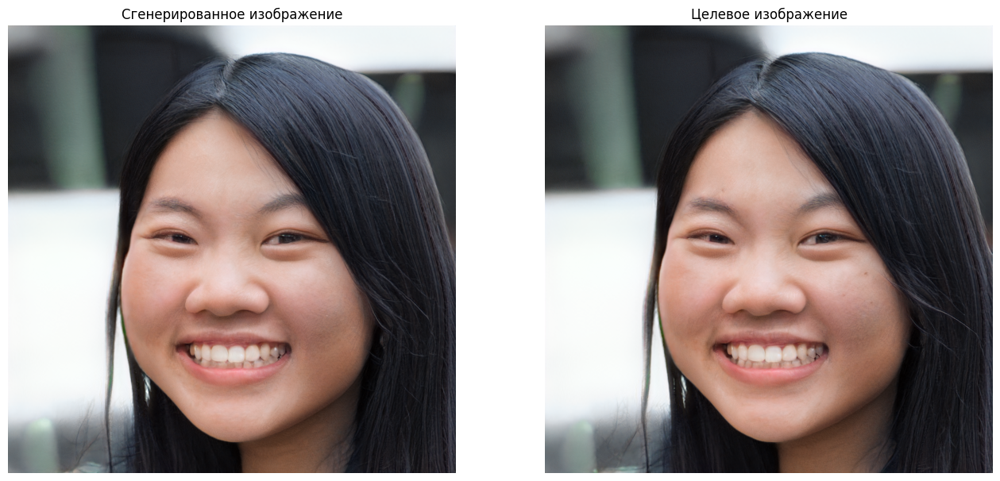

tensor([[0.7764]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7744]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7725]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7710]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7695]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7681]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7671]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7661]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)
tensor([[0.7651]], device='cuda:0', dtype=torch.float16,
       grad_fn=<RsubBackward1>)


In [22]:
learning_rate_unfreezing = 0.001 #@param {type:"number"}
gamma_unfreezing = 0.99 #@param {type:"number"}
clip_lambda = 1 #@param {type:"number"}
num_steps_unfreezing = 10 #@param {type:"number"}
optimizer = torch.optim.Adam([latent], lr=learning_rate_unfreezing)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=gamma_unfreezing)
losses = []
for step in range(num_steps_unfreezing):
    torch.cuda.empty_cache()
    optimizer.zero_grad()
    image_target, _ = G_train([latent], input_is_latent=True, randomize_noise=False)
    clip_global_loss_value = clip_loss(image_target, text_sourse_inputs)
    loss = clip_lambda * clip_global_loss_value
    loss.backward()
    optimizer.step()  
    scheduler.step(loss.item())
    torch.cuda.empty_cache() 
    losses.append(loss.item())
    if step % 50 == 0: 
        print(f"inversion_generated_z/Step [{step}/{num_steps_unfreezing}], Loss: {losses[-1]}")  
        fig, axs = plt.subplots(1, 2, figsize=(16, 32))  
        img_gen = image_target
        axs[0].imshow((img_gen.cpu().detach()[0].clip(-1,1).permute(1, 2, 0) + 1) / 2)
        axs[0].set_title("Сгенерированное изображение") 
        axs[0].axis('off') 

        axs[1].imshow((target_img.cpu().detach()[0].clip(-1,1).permute(1, 2, 0) + 1) / 2)
        axs[1].set_title("Целевое изображение")
        axs[1].axis('off')
        plt.show()

In [23]:
latent_after = latent.clone()

In [29]:
diff_tensor = latent_after - latent_before
l2_norms_per_wi = torch.norm(diff_tensor, p=2, dim=2)
l2_norms_1d = l2_norms_per_wi.squeeze(0)
sorted_values, sorted_indices = torch.sort(l2_norms_1d, descending=True)
sorted_indices = sorted_indices -2
print(f"\nОтсортированные значения L2-норм (от наибольшего к наименьшему):\n{sorted_values}")
print(f"Индексы соответствующих слоев (от слоя с наибольшим изменением к наименьшему):\n{sorted_indices}")



Отсортированные значения L2-норм (от наибольшего к наименьшему):
tensor([0.1939, 0.1929, 0.1907, 0.1883, 0.1871, 0.1846, 0.1810, 0.1807, 0.1793,
        0.1792, 0.1724, 0.1713, 0.1669, 0.1648, 0.1618, 0.1616, 0.1550, 0.1481],
       device='cuda:0', grad_fn=<SortBackward0>)
Индексы соответствующих слоев (от слоя с наибольшим изменением к наименьшему):
tensor([ 9, 14,  8,  6,  5, 11, 12,  7, 15,  2, 10, 13,  4,  3,  0, -2,  1, -1],
       device='cuda:0')


In [30]:
def get_layer_name_from_index(idx):
    if idx >= 0 and idx <= 15:
        return f'convs.{idx}'
    elif idx == -2:
        return 'conv1'
    elif idx == -1:
        return 'to_rgb1'
    else:
        return f"unknown_layer_idx_{idx}"

In [33]:
import torch
import torch.nn as nn

# --- Step 1: Freeze all the default generator parameters ---
for name, param in G_train.named_parameters():
    param.requires_grad = False

# --- Step 2: Defrost only the necessary layers ---
num_conv_blocks_to_unfreeze = 18 #@param {type:"number"}
count = 0
specific_conv_blocks_to_unfreeze = []
for idx in sorted_indices:
  if idx != -1 and count < num_conv_blocks_to_unfreeze:
    specific_conv_blocks_to_unfreeze.append(get_layer_name_from_index(idx))
    count += 1
unfrozen_layers_count = 0
for name, param in G_train.named_parameters():
    # Check if the parameter name starts with one of the required blocks
    # (for example, 'convs.3.conv.weight')
    is_target_conv_block = any(name.startswith(block_prefix) for block_prefix in specific_conv_blocks_to_unfreeze)

   # And if this is the right block, then we check that it is 'weight' and not 'modulation'
    if is_target_conv_block and 'weight' in name and 'modulation' not in name  and 'noise' not in name:
        param.requires_grad = True
        unfrozen_layers_count += 1
        print(f"Unfrozen: {name}")

print(f"\nTotal parameters unfrozen: {unfrozen_layers_count}")

print(f"\nTotal parameters unfrozen: {unfrozen_layers_count}")

# --- Optional: Checking the requires_grad status for multiple parameters ---
print("\nChecking the requires_grad status for some parameters:")
for name, param in G_train.named_parameters():
    if 'convs.0.conv.weight' in name or \
       'convs.0.conv.modulation.weight' in name or \
       'style.1.weight' in name or \
       'to_rgb1.conv.weight' in name:
        print(f"{name}: requires_grad = {param.requires_grad}")



Замораживаем все параметры генератора...

Размораживаем выбранные свёрточные слои...

Размораживаем выбранные свёрточные слои...
Разморожен: conv1.conv.weight
Разморожен: convs.0.conv.weight
Разморожен: convs.1.conv.weight
Разморожен: convs.2.conv.weight
Разморожен: convs.3.conv.weight
Разморожен: convs.4.conv.weight
Разморожен: convs.5.conv.weight
Разморожен: convs.6.conv.weight
Разморожен: convs.7.conv.weight
Разморожен: convs.8.conv.weight
Разморожен: convs.9.conv.weight
Разморожен: convs.10.conv.weight
Разморожен: convs.11.conv.weight
Разморожен: convs.12.conv.weight
Разморожен: convs.13.conv.weight
Разморожен: convs.14.conv.weight
Разморожен: convs.15.conv.weight

Всего разморожено параметров: 17

Всего разморожено параметров: 17

Проверка статуса requires_grad для некоторых параметров:
style.1.weight: requires_grad = False
to_rgb1.conv.weight: requires_grad = False
convs.0.conv.weight: requires_grad = True
convs.0.conv.modulation.weight: requires_grad = False


## Training

In [34]:
seed = 3456
torch.manual_seed(seed)

In [35]:
import os
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [36]:
def latent_creation():
  latent_z = torch.randn(10000, 512, device=device) # Z noise
  latent_z_generated = latent_z.mean(0, keepdim=True)
  with torch.no_grad():
    latent_w = generator.style(latent_z_generated)
  initial_w_plus = latent_w.unsqueeze(1).repeat(1, num_conv, 1)
  latent = initial_w_plus.detach().clone()
  return latent

In [37]:
def denorm(img_tensors):
    stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
    return img_tensors * stats[1][0] + stats[0][0]

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch 

def save_samples_custom(step, list_val_image_source, list_val_image_target, batch_size, sample_dir='generated'):
    """
    Сохраняет сгенерированные и исходные изображения в виде сетки.

    Args:
        step (int): Текущий шаг или эпоха обучения (для имени файла).
        list_val_image_source (list of torch.Tensor): Список тензоров исходных изображений.
        list_val_image_target (list of torch.Tensor): Список тензоров целевых изображений.
        batch_size (int): Размер батча, определяющий количество столбцов.
        sample_dir (str): Директория для сохранения изображений.
    """
    os.makedirs(sample_dir, exist_ok=True)

    fig, axes = plt.subplots(2, batch_size, figsize=(batch_size * 2, 4))

    for i in range(batch_size):
        ax_target = axes[0, i]
        img_target = list_val_image_target[i].cpu().detach()
        if img_target.ndim == 4 and img_target.shape[0] == 1: 
            img_target = img_target.squeeze(0) 
        img_target = img_target.numpy()

        if img_target.shape[0] == 3:
            img_target = np.transpose(img_target, (1, 2, 0))
        img_target = (img_target * 0.5 + 0.5) if img_target.min() < 0 else img_target
        ax_target.imshow(img_target.clip(0,1)) 
        ax_target.axis('off')
        if i == 0:
            ax_target.set_ylabel("Target", rotation=90, size='large', ha='right', va='center')


        
        ax_source = axes[1, i]
        img_source = list_val_image_source[i].cpu().detach()
        if img_source.ndim == 4 and img_source.shape[0] == 1: 
            img_source = img_source.squeeze(0) 
        img_source = img_source.numpy()

        if img_source.shape[0] == 3: 
            img_source = np.transpose(img_source, (1, 2, 0))
        img_source = (img_source * 0.5 + 0.5) if img_source.min() < 0 else img_source
        ax_source.imshow(img_source.clip(0,1)) 
        ax_source.axis('off')
        if i == 0:
            ax_source.set_ylabel("Source", rotation=90, size='large', ha='right', va='center')

    plt.tight_layout()
    plt.show()

/content/stylegan2-pytorch/op/conv2d_gradfix.py:88: UserWarning: conv2d_gradfix not supported on PyTorch 2.6.0+cu124. Falling back to torch.nn.functional.conv2d().
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Step [0/600], Train_Loss: 0.9997729063034058


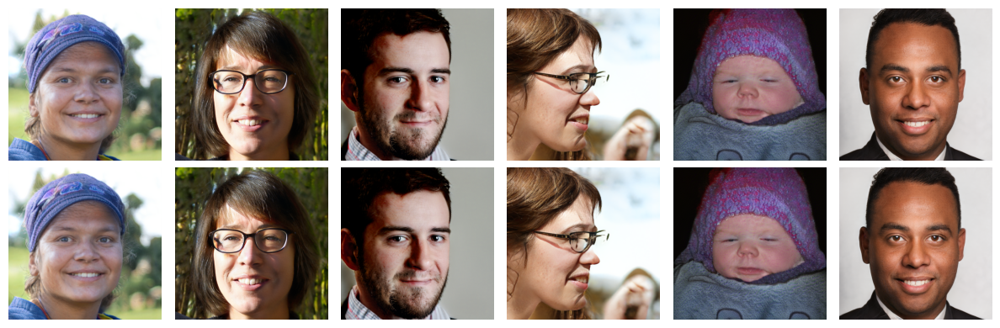

Step [0/600], Val_Loss: 0.9995064636071523
Step [1/600], Train_Loss: 0.9996141493320465
Step [1/600], Val_Loss: 0.998705675204595
Step [2/600], Train_Loss: 0.9997179508209229
Step [2/600], Val_Loss: 0.9976680080095927
Step [3/600], Train_Loss: 0.9981036484241486
Step [3/600], Val_Loss: 0.9977885584036509
Step [4/600], Train_Loss: 0.9984802603721619
Step [4/600], Val_Loss: 0.997768392165502
Step [5/600], Train_Loss: 0.9979834854602814
Step [5/600], Val_Loss: 0.9982118606567383
Step [6/600], Train_Loss: 0.9960419535636902
Step [6/600], Val_Loss: 0.9976920982201894
Step [7/600], Train_Loss: 0.9967536926269531
Step [7/600], Val_Loss: 0.9963722229003906
Step [8/600], Train_Loss: 0.9981344044208527
Step [8/600], Val_Loss: 0.9966473380724589
Step [9/600], Train_Loss: 0.9979453980922699
Step [9/600], Val_Loss: 0.9963339269161224
Step [10/600], Train_Loss: 0.9961759448051453
Step [10/600], Val_Loss: 0.9972468515237173
Step [11/600], Train_Loss: 0.9939610958099365
Step [11/600], Val_Loss: 0.9955

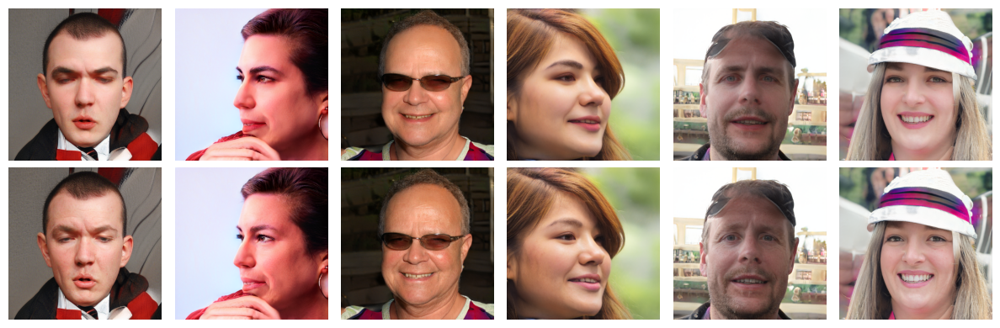

Step [50/600], Val_Loss: 1.0000199874242146
Step [51/600], Train_Loss: 1.0036652386188507
Step [51/600], Val_Loss: 1.0099000831445057
Step [52/600], Train_Loss: 0.9937894344329834
Step [52/600], Val_Loss: 1.0097740491231282
Step [53/600], Train_Loss: 1.015605866909027
Step [53/600], Val_Loss: 1.0060402949651082
Step [54/600], Train_Loss: 0.9887149333953857
Step [54/600], Val_Loss: 1.004095623890559
Step [55/600], Train_Loss: 1.0085209608078003
Step [55/600], Val_Loss: 0.9967131117979685
Step [56/600], Train_Loss: 1.0078710615634918
Step [56/600], Val_Loss: 1.0019525388876598
Step [57/600], Train_Loss: 0.9965412318706512
Step [57/600], Val_Loss: 1.0063109596570332
Step [58/600], Train_Loss: 1.0146362781524658
Step [58/600], Val_Loss: 1.0018509725729625
Step [59/600], Train_Loss: 1.0017780661582947
Step [59/600], Val_Loss: 1.006580392519633
Step [60/600], Train_Loss: 1.0040938258171082
Step [60/600], Val_Loss: 1.0042154987653096
Step [61/600], Train_Loss: 1.0072037279605865
Step [61/600]

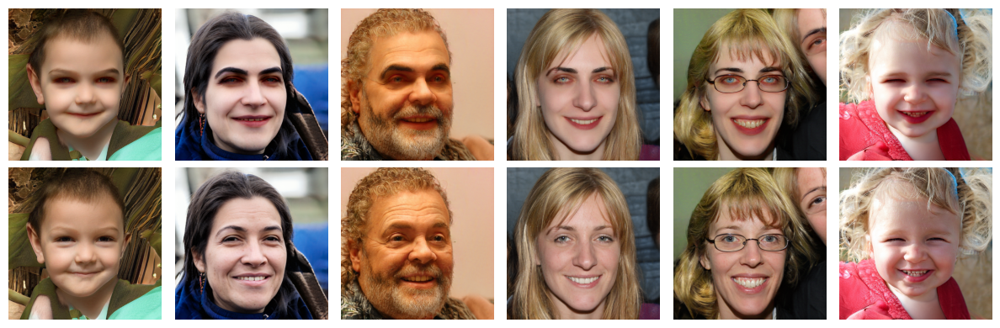

Step [100/600], Val_Loss: 1.0125472048918407
Step [101/600], Train_Loss: 1.0183297395706177
Step [101/600], Val_Loss: 1.0077957014242809
Step [102/600], Train_Loss: 0.9851846098899841
Step [102/600], Val_Loss: 1.0126101076602936
Step [103/600], Train_Loss: 1.0075120329856873
Step [103/600], Val_Loss: 1.0154425501823425
Step [104/600], Train_Loss: 1.0119596123695374
Step [104/600], Val_Loss: 1.0204774538675945
Step [105/600], Train_Loss: 1.0131650567054749
Step [105/600], Val_Loss: 1.003292202949524
Step [106/600], Train_Loss: 1.011822521686554
Step [106/600], Val_Loss: 1.0125194589296977
Step [107/600], Train_Loss: 0.9986191391944885
Step [107/600], Val_Loss: 1.0172685186068218
Step [108/600], Train_Loss: 1.027193307876587
Step [108/600], Val_Loss: 1.007025937239329
Step [109/600], Train_Loss: 0.9988475441932678
Step [109/600], Val_Loss: 1.002760907014211
Step [110/600], Train_Loss: 1.0024646818637848
Step [110/600], Val_Loss: 1.003717452287674
Step [111/600], Train_Loss: 0.97040492296

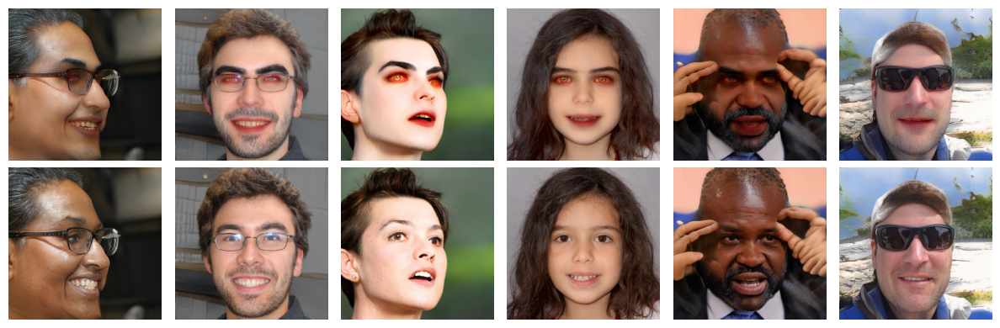

Step [150/600], Val_Loss: 1.0224599341551464
Step [151/600], Train_Loss: 1.0039533078670502
Step [151/600], Val_Loss: 1.0091958145300548
Step [152/600], Train_Loss: 1.0307769179344177
Step [152/600], Val_Loss: 1.008436640103658
Step [153/600], Train_Loss: 1.0226975679397583
Step [153/600], Val_Loss: 0.9976080258687338
Step [154/600], Train_Loss: 1.0369171500205994
Step [154/600], Val_Loss: 1.0144321819146473
Step [155/600], Train_Loss: 1.0051500797271729
Step [155/600], Val_Loss: 1.0098669628302257
Step [156/600], Train_Loss: 1.0128607153892517
Step [156/600], Val_Loss: 1.0065348049004872
Step [157/600], Train_Loss: 1.0062316060066223
Step [157/600], Val_Loss: 1.006371945142746
Step [158/600], Train_Loss: 1.0026689767837524
Step [158/600], Val_Loss: 1.0112973749637604
Step [159/600], Train_Loss: 1.0056205987930298
Step [159/600], Val_Loss: 1.0158477524916332
Step [160/600], Train_Loss: 1.022674024105072
Step [160/600], Val_Loss: 1.002588301897049
Step [161/600], Train_Loss: 1.018854498

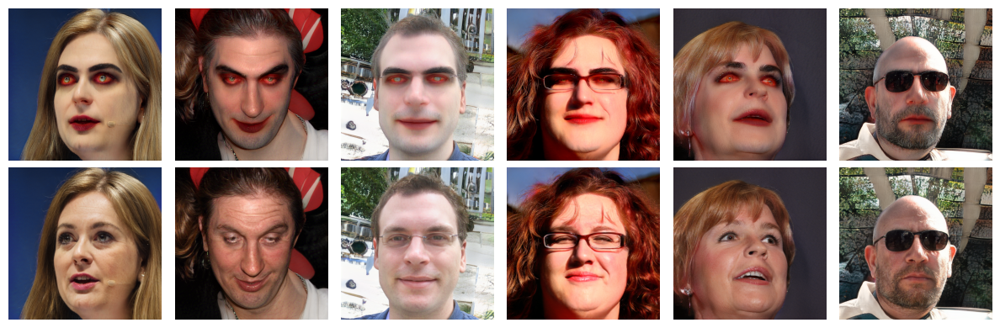

Step [200/600], Val_Loss: 1.0162128508090973
Step [201/600], Train_Loss: 1.0030494332313538
Step [201/600], Val_Loss: 1.0089567999045055
Step [202/600], Train_Loss: 1.009848803281784
Step [202/600], Val_Loss: 0.998730331659317
Step [203/600], Train_Loss: 1.030823528766632
Step [203/600], Val_Loss: 1.0186948974927266
Step [204/600], Train_Loss: 0.9860795140266418
Step [204/600], Val_Loss: 1.0060576697190602
Step [205/600], Train_Loss: 0.9995641708374023
Step [205/600], Val_Loss: 1.0295530259609222
Step [206/600], Train_Loss: 1.007882833480835
Step [206/600], Val_Loss: 0.9987809161345164
Step [207/600], Train_Loss: 0.9845601916313171
Step [207/600], Val_Loss: 0.9980217119057974
Step [208/600], Train_Loss: 1.0121350288391113
Step [208/600], Val_Loss: 1.0208699703216553
Step [209/600], Train_Loss: 1.0149361491203308
Step [209/600], Val_Loss: 1.0074539581934612
Step [210/600], Train_Loss: 1.0259932279586792
Step [210/600], Val_Loss: 1.0101948479811351
Step [211/600], Train_Loss: 1.022019982

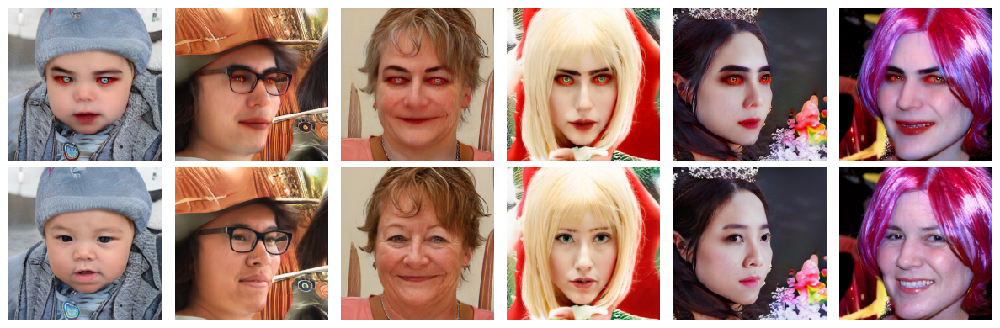

Step [250/600], Val_Loss: 1.0154432753721874
Step [251/600], Train_Loss: 0.9874198138713837
Step [251/600], Val_Loss: 1.018804947535197
Step [252/600], Train_Loss: 1.019128680229187
Step [252/600], Val_Loss: 1.01175660888354
Step [253/600], Train_Loss: 1.0085279643535614
Step [253/600], Val_Loss: 0.9968289732933044
Step [254/600], Train_Loss: 1.0091937184333801
Step [254/600], Val_Loss: 1.0013618965943654
Step [255/600], Train_Loss: 1.00238436460495
Step [255/600], Val_Loss: 1.0239454011122386
Step [256/600], Train_Loss: 1.0102059841156006
Step [256/600], Val_Loss: 0.9944145282109579
Step [257/600], Train_Loss: 1.0208539962768555
Step [257/600], Val_Loss: 1.0072927574316661
Step [258/600], Train_Loss: 1.0004786849021912
Step [258/600], Val_Loss: 0.9965514640013377
Step [259/600], Train_Loss: 0.9731242060661316
Step [259/600], Val_Loss: 1.0047851502895355
Step [260/600], Train_Loss: 0.9777993261814117
Step [260/600], Val_Loss: 0.9900879462560018
Step [261/600], Train_Loss: 0.97547173500

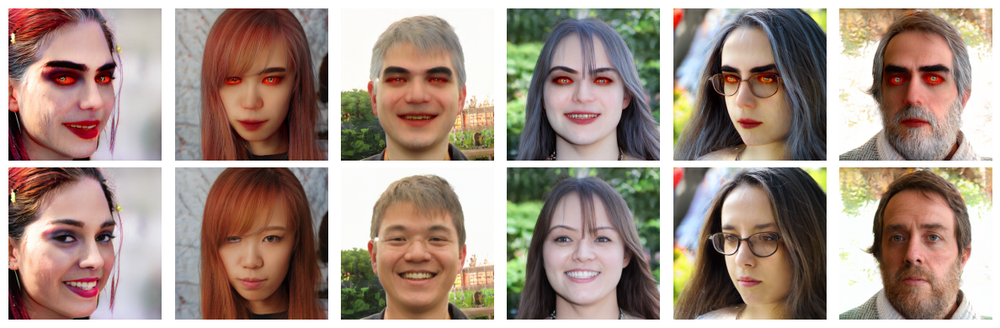

Step [300/600], Val_Loss: 0.9930891692638397
Step [301/600], Train_Loss: 0.9936595857143402
Step [301/600], Val_Loss: 1.0065489411354065
Step [302/600], Train_Loss: 1.024079442024231
Step [302/600], Val_Loss: 1.019470860560735
Step [303/600], Train_Loss: 1.006610780954361
Step [303/600], Val_Loss: 1.0111272633075714
Step [304/600], Train_Loss: 1.0172266364097595
Step [304/600], Val_Loss: 0.9996250967184702
Step [305/600], Train_Loss: 1.0307725071907043
Step [305/600], Val_Loss: 1.0049915115038555
Step [306/600], Train_Loss: 0.9960426688194275
Step [306/600], Val_Loss: 0.9909660418828329
Step [307/600], Train_Loss: 1.0339115262031555
Step [307/600], Val_Loss: 0.9949987928072611
Step [308/600], Train_Loss: 0.998053103685379
Step [308/600], Val_Loss: 1.0107599099477131
Step [309/600], Train_Loss: 1.0410065054893494
Step [309/600], Val_Loss: 1.0238913297653198
Step [310/600], Train_Loss: 0.9867478609085083
Step [310/600], Val_Loss: 0.9825089871883392
Step [311/600], Train_Loss: 1.006546795

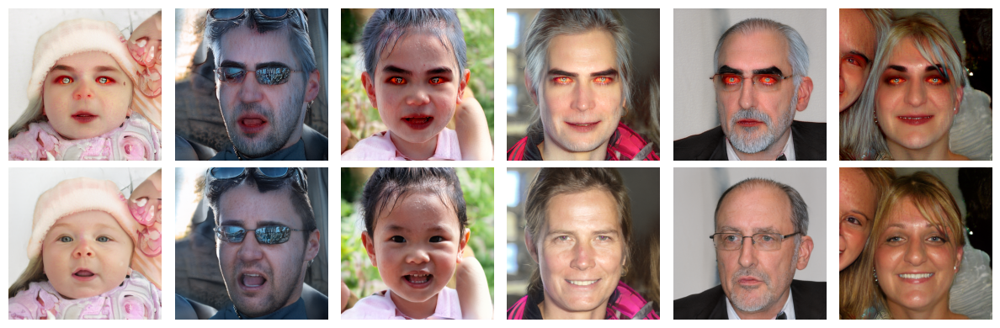

Step [350/600], Val_Loss: 0.98474849263827
Step [351/600], Train_Loss: 1.0023466348648071
Step [351/600], Val_Loss: 1.0153281688690186
Step [352/600], Train_Loss: 1.017241358757019
Step [352/600], Val_Loss: 1.0198691089948018
Step [353/600], Train_Loss: 0.9574938118457794
Step [353/600], Val_Loss: 1.0120860834916432
Step [354/600], Train_Loss: 0.9993869364261627
Step [354/600], Val_Loss: 1.0161083738009136
Step [355/600], Train_Loss: 1.0404734015464783
Step [355/600], Val_Loss: 0.9869972666104635
Step [356/600], Train_Loss: 0.9900095164775848
Step [356/600], Val_Loss: 1.0143666764100392
Step [357/600], Train_Loss: 1.0164521932601929
Step [357/600], Val_Loss: 1.008312354485194
Step [358/600], Train_Loss: 1.0109434127807617
Step [358/600], Val_Loss: 1.000145047903061
Step [359/600], Train_Loss: 1.01872718334198
Step [359/600], Val_Loss: 0.9838809072971344
Step [360/600], Train_Loss: 1.028565764427185
Step [360/600], Val_Loss: 1.0213250021139781
Step [361/600], Train_Loss: 0.9918505549430

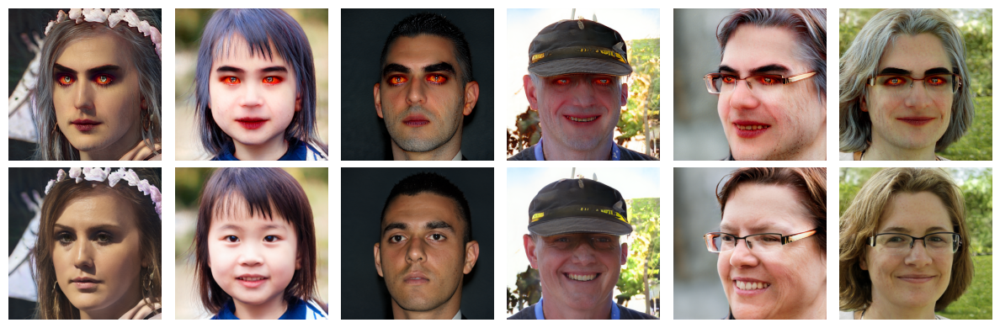

Step [400/600], Val_Loss: 1.0033415456612904
Step [401/600], Train_Loss: 0.9682838022708893
Step [401/600], Val_Loss: 1.0088775952657063
Step [402/600], Train_Loss: 1.0230990052223206
Step [402/600], Val_Loss: 0.9965249796708425
Step [403/600], Train_Loss: 0.9928792715072632
Step [403/600], Val_Loss: 1.0097090601921082
Step [404/600], Train_Loss: 1.0039783716201782
Step [404/600], Val_Loss: 0.9975327054659525
Step [405/600], Train_Loss: 1.026511311531067
Step [405/600], Val_Loss: 1.011467566092809
Step [406/600], Train_Loss: 0.9920284152030945
Step [406/600], Val_Loss: 0.9892153342564901
Step [407/600], Train_Loss: 1.0001474618911743
Step [407/600], Val_Loss: 0.9918026526769003
Step [408/600], Train_Loss: 0.9720705151557922
Step [408/600], Val_Loss: 1.0042382677396138
Step [409/600], Train_Loss: 1.0147444605827332
Step [409/600], Val_Loss: 0.9969666997591654
Step [410/600], Train_Loss: 0.9935720860958099
Step [410/600], Val_Loss: 1.002981295188268
Step [411/600], Train_Loss: 0.99716386

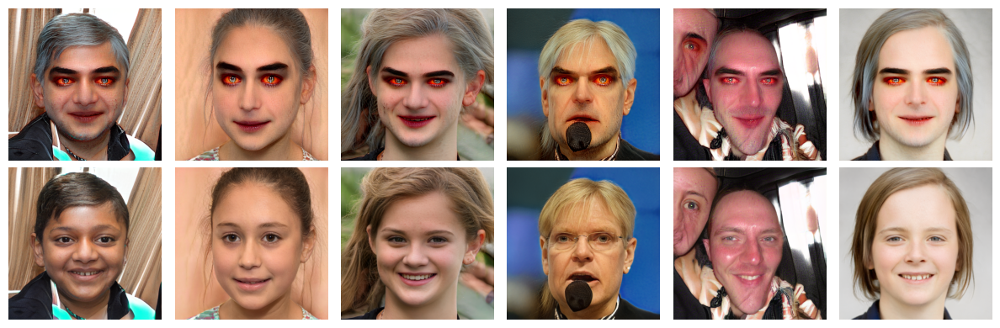

Step [450/600], Val_Loss: 0.9994183778762817
Step [451/600], Train_Loss: 1.0032764673233032
Step [451/600], Val_Loss: 1.0021654268105824
Step [452/600], Train_Loss: 0.9918421804904938
Step [452/600], Val_Loss: 0.9843209783236185
Step [453/600], Train_Loss: 0.9665184617042542
Step [453/600], Val_Loss: 1.002183884382248
Step [454/600], Train_Loss: 1.0438258647918701
Step [454/600], Val_Loss: 0.9934452374776205
Step [455/600], Train_Loss: 1.0246502161026
Step [455/600], Val_Loss: 1.0056406954924266
Step [456/600], Train_Loss: 1.0145118236541748
Step [456/600], Val_Loss: 1.003202458222707
Step [457/600], Train_Loss: 1.0027266144752502
Step [457/600], Val_Loss: 1.0069658358891804
Step [458/600], Train_Loss: 0.9999102354049683
Step [458/600], Val_Loss: 1.0061088005701702
Step [459/600], Train_Loss: 0.9956005811691284
Step [459/600], Val_Loss: 1.0109019875526428
Step [460/600], Train_Loss: 1.0182820558547974
Step [460/600], Val_Loss: 1.0123484532038372
Step [461/600], Train_Loss: 0.9861376583

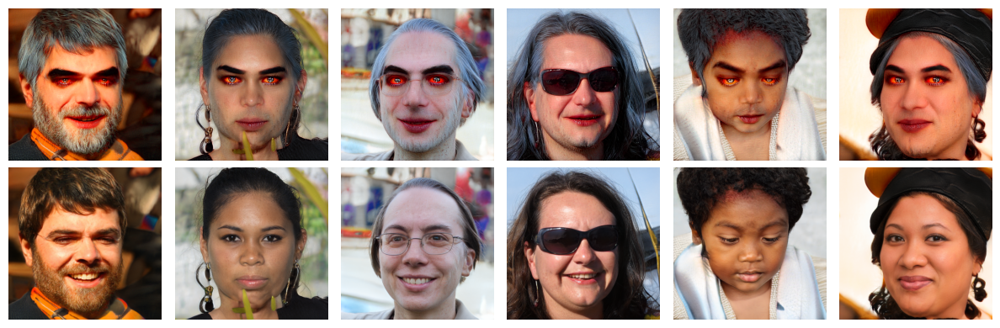

Step [500/600], Val_Loss: 0.9852302769819895
Step [501/600], Train_Loss: 1.000073403120041
Step [501/600], Val_Loss: 1.0016526679197948
Step [502/600], Train_Loss: 1.0117685794830322
Step [502/600], Val_Loss: 0.9987805287043253
Step [503/600], Train_Loss: 0.9941158890724182
Step [503/600], Val_Loss: 0.9950021803379059
Step [504/600], Train_Loss: 0.986314207315445
Step [504/600], Val_Loss: 0.983501801888148
Step [505/600], Train_Loss: 0.9985436797142029
Step [505/600], Val_Loss: 0.9960172573725382
Step [506/600], Train_Loss: 1.0039127469062805
Step [506/600], Val_Loss: 1.0007140040397644
Step [507/600], Train_Loss: 0.9968460500240326
Step [507/600], Val_Loss: 0.9940836330254873
Step [508/600], Train_Loss: 1.0266311168670654
Step [508/600], Val_Loss: 0.99728391567866
Step [509/600], Train_Loss: 1.0090113282203674
Step [509/600], Val_Loss: 1.0013184547424316
Step [510/600], Train_Loss: 0.9716819524765015
Step [510/600], Val_Loss: 0.9930082360903422
Step [511/600], Train_Loss: 1.0143273770

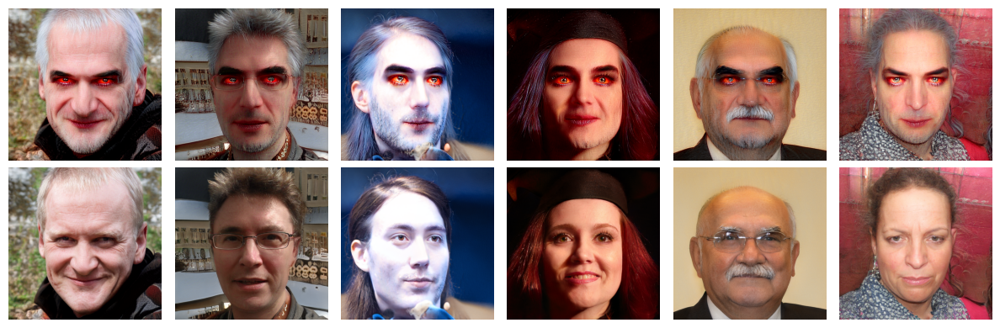

Step [550/600], Val_Loss: 1.00594566265742
Step [551/600], Train_Loss: 1.0040082931518555
Step [551/600], Val_Loss: 1.014109343290329
Step [552/600], Train_Loss: 1.0114121437072754
Step [552/600], Val_Loss: 0.9903210401535034
Step [553/600], Train_Loss: 0.9967578053474426
Step [553/600], Val_Loss: 0.9930540323257446
Step [554/600], Train_Loss: 1.0094652771949768
Step [554/600], Val_Loss: 1.0034843782583873
Step [555/600], Train_Loss: 1.0064929127693176
Step [555/600], Val_Loss: 1.004854291677475
Step [556/600], Train_Loss: 0.9859446287155151
Step [556/600], Val_Loss: 0.9746293226877848
Step [557/600], Train_Loss: 0.9907431900501251
Step [557/600], Val_Loss: 0.9939132928848267
Step [558/600], Train_Loss: 0.9884350001811981
Step [558/600], Val_Loss: 1.0075925489266713
Step [559/600], Train_Loss: 0.9856021702289581
Step [559/600], Val_Loss: 0.9726708630720774
Step [560/600], Train_Loss: 1.0203038454055786
Step [560/600], Val_Loss: 1.010295073191325
Step [561/600], Train_Loss: 1.0295060873

In [39]:
train_losses = {'id': [],
          'l2': [],
          'clip': [],
          'all': []
          }
val_losses = {'id': [],
          'l2': [],
          'clip': [],
          'all': []
          }
l2_lambda = 0.35 #@param {'type': 'number'}
clip_lambda = 1  #@param {'type': 'number'}
id_lambda = 0.2 #@param {'type': 'number'}
batch_size = 2  #@param {'type': 'number'}
val_batch_size = 6 #@param {'type': 'number'}
num_steps = 600 #@param {'type': 'number'}
learning_rate = 0.0002 #@param {'type': 'number'}
gamma = 0.99 #@param {'type': 'number'}
mse = torch.nn.MSELoss()
optimizer = torch.optim.Adam(G_train.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma)  # Плавное снижение скорости обучения
for step in range(num_steps):
    torch.cuda.empty_cache()
    G_train.train()
    train_id_loss_list = []
    train_l2_loss_list = []
    train_clip_loss_list = []
    train_all_loss_list = []
    for _ in range(batch_size):
      optimizer.zero_grad()
      latent = latent_creation()
      latent.requires_grad = False
      with torch.no_grad():
        image_source, _ = G_frozen([latent], input_is_latent=True, randomize_noise=False)
      image_target, _ = G_train([latent], input_is_latent=True, randomize_noise=False)
      train_id_loss_value = id_loss(image_source, image_target)
      train_l2_loss_value = mse(image_source, image_target)
      train_clip_loss_value = clip_dir_loss(image_source, text_sourse_inputs, image_target, text_inputs)
      train_loss = train_id_loss_value * id_lambda + train_l2_loss_value * l2_lambda + clip_lambda * train_clip_loss_value
      train_loss.backward()
      optimizer.step()
      scheduler.step(train_loss.item())
      train_id_loss_list.append(train_id_loss_value.item())
      train_l2_loss_list.append(train_l2_loss_value.item())
      train_clip_loss_list.append(train_clip_loss_value.item())
      train_all_loss_list.append(train_loss.item())
    train_losses['id'].append(np.mean(train_id_loss_list))
    train_losses['l2'].append(np.mean(train_l2_loss_list))
    train_losses['clip'].append(np.mean(train_clip_loss_list))
    train_losses['all'].append(np.mean(train_all_loss_list))
    print(f"Step [{step}/{num_steps}], Train_Loss: {train_losses['all'][-1]}")
    G_train.eval()
    val_id_loss_list = []
    val_l2_loss_list = []
    val_clip_loss_list = []
    val_all_loss_list = []
    list_val_image_source = []
    list_val_image_target = []
    for _ in range(val_batch_size):
      latent = latent_creation()
      latent.requires_grad = False
      with torch.no_grad(): 
        image_source, _ = G_frozen([latent], input_is_latent=True, randomize_noise=False)
      image_target, _ = G_train([latent], input_is_latent=True, randomize_noise=False)
      val_id_loss_value = id_loss(image_source, image_target)
      val_l2_loss_value = mse(image_source, image_target)
      val_clip_loss_value = clip_dir_loss(image_source, text_sourse_inputs, image_target, text_inputs)
      val_loss = val_id_loss_value * id_lambda + val_l2_loss_value * l2_lambda + clip_lambda * val_clip_loss_value
      val_id_loss_list.append(val_id_loss_value.item())
      val_l2_loss_list.append(val_l2_loss_value.item())
      val_clip_loss_list.append(val_clip_loss_value.item())
      val_all_loss_list.append(val_loss.item())
      list_val_image_source.append(image_source)
      list_val_image_target.append(image_target)
    val_losses['id'].append(np.mean(val_id_loss_list))
    val_losses['l2'].append(np.mean(val_l2_loss_list))
    val_losses['clip'].append(np.mean(val_clip_loss_list))
    val_losses['all'].append(np.mean(val_all_loss_list))
    if step % 50 == 0: save_samples_custom(step, list_val_image_source, list_val_image_target, val_batch_size)
    print(f"Step [{step}/{num_steps}], Val_Loss: {val_losses['all'][-1]}")
    torch.cuda.empty_cache()  


In [40]:
def visualization(in_losses, loss_name = 'Train Loss'):
  plt.plot(in_losses['all'], label='Summ')
  plt.plot(in_losses['l2'], label='l2')
  plt.plot(in_losses['id'], label='id')
  plt.plot(in_losses['clip'], label='clip')
  plt.title(loss_name + " vs. Step")
  plt.xlabel("Step")
  plt.ylabel(loss_name)
  plt.legend()
  plt.show()

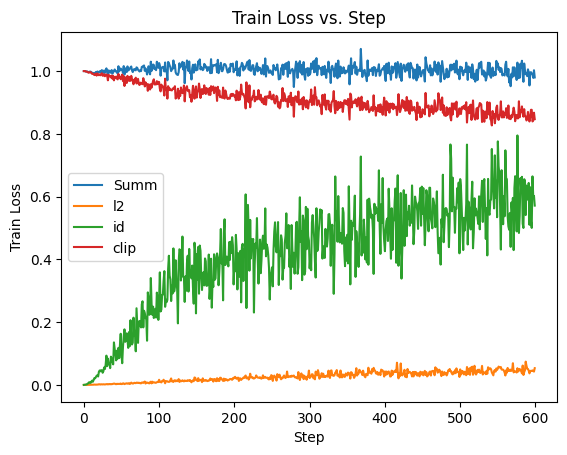

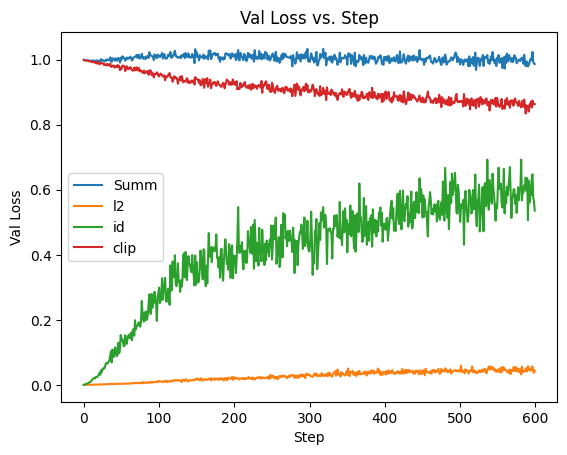

In [41]:
visualization(train_losses, loss_name = 'Train Loss')
visualization(val_losses, loss_name = 'Val Loss')